# Ifood - Test

# Librerías

In [1]:
import requests
import numpy as np
import numba
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime, timedelta
import pandas_profiling
import plotly.express as px
from mpl_toolkits import mplot3d
import re

import scipy
import sklearn
from scipy.stats import norm
from sklearn.cluster import KMeans
from sklearn.preprocessing import (
    MinMaxScaler,
    MaxAbsScaler,
    RobustScaler,
    StandardScaler,
)
from sklearn import metrics
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from boruta import BorutaPy
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import shap
from sklearn.utils import class_weight

from scikitplot.metrics import plot_confusion_matrix, plot_roc, plot_precision_recall, plot_cumulative_gain, plot_lift_curve

In [2]:
import warnings
warnings.filterwarnings('ignore')

## Tasks

1. **Explore the data** – be creative and pay attention to the details. You need to provide the marketing team a better understanding of the characteristic features of respondents; 

2. Create and describe a **customer segmentation based on customers behaviors**; 

3. Create and describe a **predictive model (classification)** which allows the company to maximize the profit of the next marketing campaign.

## Generate Requirements

In [3]:
!pip freeze -> requirements.txt

## Download data

In [4]:
csv_url = "https://raw.githubusercontent.com/wiflore/ifood-data-business-analyst-test-latam/main/ml_project1_data.csv"

req = requests.get(csv_url)
url_content = req.content
csv_file = open('ml_project1_data.csv', 'wb')

csv_file.write(url_content)

220186

## Read data

In [5]:
data = pd.read_csv('ml_project1_data.csv')

## EDA - Exploration Data Analysis

### Pandas Profile

In [6]:
profile = pandas_profiling.ProfileReport(data, title="report_ifood_data")

In [7]:
profile

Summarize dataset:   0%|          | 0/42 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [8]:
profile.to_file("report_ifood_data.html")

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [9]:
# Drop unnecessary columns
data = data.drop(["Z_CostContact","Z_Revenue"], axis=1)

In [10]:
# num_cols = data._get_numeric_data().columns
# cat_cols = data.select_dtypes(include=["category","object"])

### Data Wrangling

In [11]:
today = pd.Timestamp(datetime.today())

In [12]:
data["Dt_Customer"] = pd.to_datetime(data["Dt_Customer"])

# Create some new useful variables
data["age"] = today.year-data.Year_Birth
data["seniority"] = (today-data.Dt_Customer).dt.days
data["total_purchases"] = data[['NumWebPurchases','NumCatalogPurchases', 'NumStorePurchases']].sum(axis=1)
data["total_amount_spent"] = data[['MntWines', 'MntFruits','MntMeatProducts', 'MntFishProducts', 'MntSweetProducts']].sum(axis=1)
data["perc_discount_purchases"] = data.NumDealsPurchases/data.total_purchases

### Channels
channels = ['web', 'catalog', 'store']
cols_channels = ['NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases']

for i, ch in enumerate(cols_channels):
    data["perc_" + channels[i]] = data[ch]/data.total_purchases
    
### Products
prods = ['wines', 'fruits', 'meat', 'fish', 'sweet']
cols_prods = ['MntWines', 'MntFruits','MntMeatProducts', 'MntFishProducts', 'MntSweetProducts']

for i, prod in enumerate(cols_prods):
    data["perc_" + prods[i]] = data[prod]/data.total_amount_spent
    
# Fill NaN or Inf
mean_income = data.Income.mean()
data["Income"].fillna(mean_income, inplace=True)
data["perc_discount_purchases"].fillna(0, inplace=True)
data.perc_discount_purchases.replace([np.inf, -np.inf], 0, inplace=True)
data['perc_web'].fillna(0, inplace=True)
data['perc_catalog'].fillna(0, inplace=True)
data['perc_store'].fillna(0, inplace=True)

## Respondents

In [13]:
respondents = data[data.Response==1]

In [14]:
respondents.shape[0] / data.shape[0]

0.14910714285714285

In [15]:
respondents.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,total_amount_spent,perc_discount_purchases,perc_web,perc_catalog,perc_store,perc_wines,perc_fruits,perc_meat,perc_fish,perc_sweet
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,...,1529,0.136364,0.363636,0.454545,0.181818,0.415304,0.057554,0.357096,0.112492,0.057554
8,4855,1974,PhD,Together,30351.0,1,0,2013-06-06,19,14,...,44,0.200000,0.600000,0.000000,0.400000,0.318182,0.000000,0.545455,0.068182,0.068182
15,2114,1946,PhD,Single,82800.0,0,0,2012-11-24,23,1006,...,1270,0.040000,0.280000,0.240000,0.480000,0.792126,0.017323,0.090551,0.046457,0.053543
33,7373,1952,PhD,Divorced,46610.0,0,2,2012-10-29,8,96,...,259,0.545455,0.363636,0.090909,0.545455,0.370656,0.046332,0.370656,0.127413,0.084942
39,2968,1943,PhD,Divorced,48948.0,0,0,2013-02-01,53,437,...,860,0.090909,0.318182,0.454545,0.227273,0.508140,0.009302,0.239535,0.186047,0.056977


<AxesSubplot:xlabel='Education', ylabel='Income'>

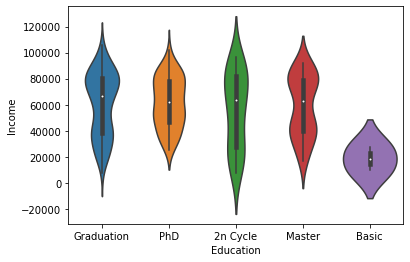

In [16]:
sns.violinplot(x="Education", y="Income", data = respondents)

<AxesSubplot:xlabel='Marital_Status', ylabel='Income'>

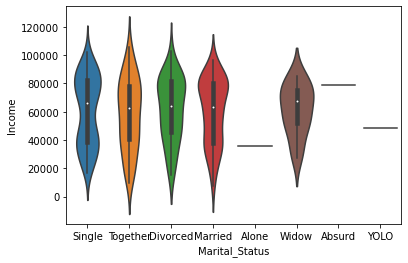

In [17]:
sns.violinplot(x="Marital_Status", y="Income", data = respondents)

In [18]:
#sns.pairplot(respondents) 

### Summary - Respondents

- Number of customers = 334 (~14.9%)

# Customer segmentation

### Functions

In [19]:
def elbow_silhoutte(data, max_k=10):
    # Elbow Method
    sum_sq_d = []
    sh_score = []
    K = range(1, max_k)
    for k in K:
        km = KMeans(n_clusters=k, init="k-means++")
        km = km.fit(data)
        sum_sq_d.append(km.inertia_)
        if k > 1:
            sh_score.append(
                metrics.silhouette_score(data, km.labels_, metric="euclidean")
            )

    fig_elbow = plt.figure(figsize=(8, 6))
    plt.plot(K, sum_sq_d, "x-.")
    plt.xlabel("Number of Clusters, k", fontsize=12)
    plt.ylabel("Sum of Squared Distances", fontsize=12)
    plt.title(r"Elbow Method - Determinación del número de clusters", fontsize=16)
    plt.xticks(range(1, max_k), fontsize=12)
    plt.show()
    plt.close()

    fig_silh = plt.figure(figsize=(8, 6))
    plt.plot(K[1:], sh_score, "x-.")
    plt.xlabel("Number of Clusters, k", fontsize=12)
    plt.ylabel("Silhouette Score", fontsize=12)
    plt.title(r"Silhouette Score - Determinación del número de clusters", fontsize=16)
    plt.xticks(range(1, max_k), fontsize=12)
    plt.show()
    plt.close()
    
    return fig_elbow, fig_silh

def PCA_transform(data, n_comp=3):
    pca = PCA(n_components=len(data.columns))
    principalComponents = pca.fit_transform(data)
    PCA_components = pd.DataFrame(principalComponents)

    # Plot the explained variances
    plt.figure()
    features = range(pca.n_components_)
    plt.bar(features, pca.explained_variance_ratio_)
    plt.xlabel("PCA features")
    plt.ylabel("variance %")
    plt.xticks(features)
    plt.show()

    plt.figure()
    plt.scatter(PCA_components[0], PCA_components[1], alpha=0.1)
    plt.xlabel("PCA 1")
    plt.ylabel("PCA 2")
    plt.show()

    plt.figure()
    plt.scatter(PCA_components[0], PCA_components[2], alpha=0.1)
    plt.xlabel("PCA 1")
    plt.ylabel("PCA 3")
    plt.show()

    plt.figure()
    plt.scatter(PCA_components[1], PCA_components[2], alpha=0.1)
    plt.xlabel("PCA 2")
    plt.ylabel("PCA 3")
    plt.show()

    pca_data = PCA_components.iloc[:, :n_comp].rename(
        columns={0: "Component_1", 1: "Component_2", 2: "Component_3"}
    )

    return pca_data

def plot_tsne_2d(n_comp, data, label):
    tsne_2d = TSNE(n_components=2).fit_transform(data)
    tsne_2d = pd.DataFrame(tsne_2d, columns=["X", "Y"])
    tsne_2d["label"] = label

    tnse_fig = plt.figure(figsize=(12, 6))
    sns.scatterplot(x="X", y="Y", hue="label", palette="deep", data=tsne_2d)
    plt.title("T-SNE Dimensionality Reduction 2D - Clusters visualization")
    plt.close()

    return tnse_fig

def kmeans_clustering(data, k=4, apply_scale=True, apply_pca=False, n_comp=3):
    # K-Means

    if apply_pca:
        if apply_scale:

            scaler = StandardScaler()
            data_scale = pd.DataFrame(scaler.fit_transform(data), columns=data.columns)

            pca = PCA(n_components=len(data_scale.columns))
            principalComponents = pca.fit_transform(data_scale)
            PCA_components = pd.DataFrame(principalComponents)
            pca_data = PCA_components.iloc[:, :n_comp].rename(
                columns={0: "Component_1", 1: "Component_2", 2: "Component_3"}
            )

            clustering_data = pca_data.copy()

        else:

            pca = PCA(n_components=len(data.columns))
            principalComponents = pca.fit_transform(data)
            PCA_components = pd.DataFrame(principalComponents)
            pca_data = PCA_components.iloc[:, :n_comp].rename(
                columns={0: "Component_1", 1: "Component_2", 2: "Component_3"}
            )

            clustering_data = pca_data.copy()

    else:
        if apply_scale:
            scaler = StandardScaler()
            data_scale = pd.DataFrame(scaler.fit_transform(data), columns=data.columns)

            clustering_data = data_scale.copy()
        else:

            clustering_data = data.copy()

    print("--------------------------------")
    print("Customers:", clustering_data.shape[0])
    print("--------------------------------")

    kmeans = KMeans(n_clusters=k, init="k-means++")
    kmeans.fit(clustering_data)

    # Iterative procedure to learn labels
    labels = kmeans.predict(clustering_data)
    centroids = kmeans.cluster_centers_

    centroids_df = pd.DataFrame(centroids, columns=clustering_data.columns)

    data["label"] = labels
    clustering_data["label"] = labels

    score = metrics.silhouette_score(clustering_data, labels, metric="euclidean")

    print("--------------------------------")
    print("Silhouette score:", score)
    print("--------------------------------")

    return kmeans, data, clustering_data, centroids_df, score, labels

def cluster_assignment(centroids, data_points):
    centroids = np.array(centroids)
    points = np.array(data_points)
    P, C = points.shape[0], centroids.shape[0]
    distances = np.zeros((P, C), dtype=np.float32)
    for p in range(P):
        for c in range(C):
            distances[p, c] = np.sum(np.square(centroids[c] - points[p]))

    data_points["customer_label"] = np.argmin(distances, axis=1)
    #data_points["segmentation_group_name"] = data_points["customer_label"].map(assign_cluster_name)
    customer_cluster = data_points.reset_index()[["customer_id", "customer_label"]] #, "segmentation_group_name"]]

    return customer_cluster

## Feature selection

In [20]:
cols_segmentation = ["Recency","total_purchases","total_amount_spent", "Income", "age",
                      "NumWebVisitsMonth", "seniority", 'MntGoldProds','perc_discount_purchases',
                    'perc_web', 'perc_catalog', 'perc_store', 'perc_wines', 'perc_fruits',
                    'perc_meat', 'perc_fish','perc_sweet']

In [21]:
data_segmentation = data[cols_segmentation]

In [22]:
data_segmentation.describe().round(1)

,Recency,total_purchases,total_amount_spent,Income,age,NumWebVisitsMonth,seniority,MntGoldProds,perc_discount_purchases,perc_web,perc_catalog,perc_store,perc_wines,perc_fruits,perc_meat,perc_fish,perc_sweet
count,2240.0,2240.0,2240.0,2240.0,2240.0,2240.0,2240.0,2240.0,2240.0,2240.0,2240.0,2240.0,2240.0,2240.0,2240.0,2240.0,2240.0
mean,49.1,12.5,561.8,52247.3,52.2,5.3,2876.6,44.0,0.2,0.3,0.2,0.5,0.5,0.1,0.3,0.1,0.1
std,29.0,7.2,576.6,25037.8,12.0,2.4,202.1,52.2,0.4,0.1,0.1,0.2,0.2,0.1,0.1,0.1,0.1
min,0.0,0.0,4.0,1730.0,25.0,0.0,2523.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
25%,24.0,6.0,55.0,35538.8,44.0,3.0,2703.8,9.0,0.1,0.2,0.0,0.4,0.3,0.0,0.2,0.0,0.0
50%,49.0,12.0,341.0,51741.5,51.0,6.0,2878.5,24.0,0.2,0.3,0.2,0.5,0.5,0.0,0.3,0.1,0.0
75%,74.0,18.0,964.0,68289.8,62.0,7.0,3052.0,56.0,0.3,0.4,0.2,0.6,0.7,0.1,0.4,0.1,0.1
max,99.0,32.0,2491.0,666666.0,128.0,20.0,3222.0,362.0,15.0,1.0,1.0,1.0,1.0,0.8,1.0,0.8,1.0


### Determination of the number of clusters

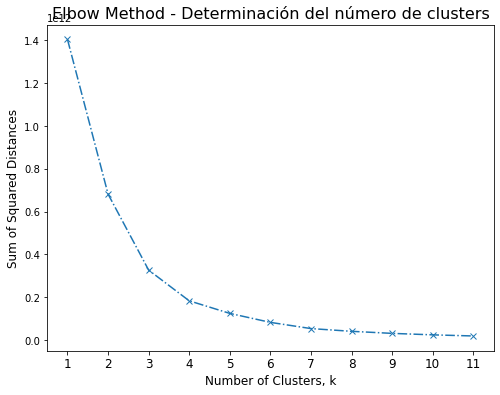

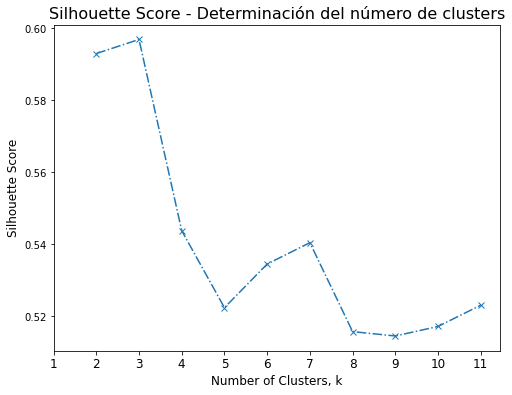

In [23]:
fig_elbow, fig_silh = elbow_silhoutte(data_segmentation, max_k=12)

### Scale data

In [24]:
scaler = StandardScaler()
data_segmentation_scale = pd.DataFrame(scaler.fit_transform(data_segmentation), columns=data_segmentation.columns)

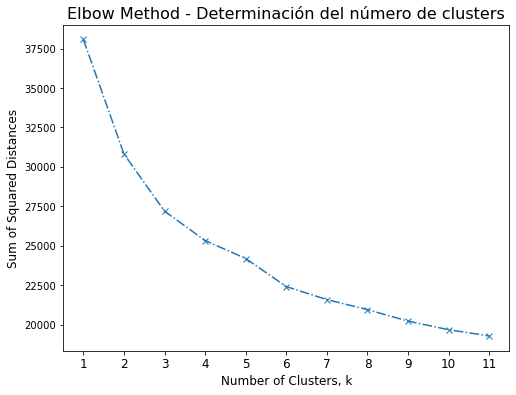

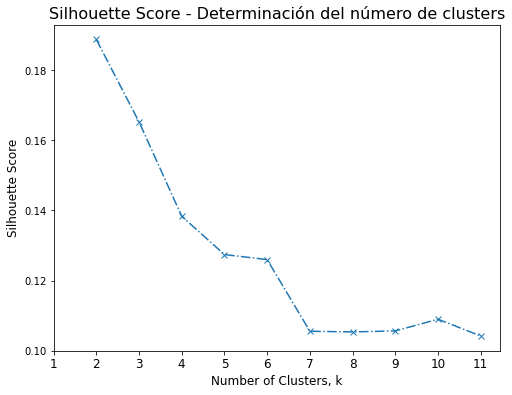

In [25]:
fig_elbow_scale, fig_silh_scale = elbow_silhoutte(data_segmentation_scale, max_k=12)

## Clustering

In [26]:
k_clusters = 3

In [27]:
kmeans, original_data, clustering_data, centroids_df, score, labels = kmeans_clustering(data_segmentation, 
                                                                                       k=k_clusters, 
                                                                                       apply_scale=True)

--------------------------------
Customers: 2240
--------------------------------
--------------------------------
Silhouette score: 0.18083840907799015
--------------------------------


In [28]:
original_data.groupby("label").agg({"total_purchases":"count"})

,total_purchases
label,
0,791
1,859
2,590


In [29]:
original_data.groupby("label").mean().round(2)

,Recency,total_purchases,total_amount_spent,Income,age,NumWebVisitsMonth,seniority,MntGoldProds,perc_discount_purchases,perc_web,perc_catalog,perc_store,perc_wines,perc_fruits,perc_meat,perc_fish,perc_sweet
label,,,,,,,,,,,,,,,,,
0,49.92,19.57,1185.57,73799.56,53.55,3.32,2892.39,79.46,0.10,0.28,0.29,0.43,0.49,0.06,0.32,0.08,0.06
1,47.99,10.62,313.50,47666.76,55.10,6.29,2860.69,28.98,0.31,0.37,0.11,0.51,0.71,0.02,0.22,0.03,0.02
2,49.65,5.90,86.95,30021.43,46.15,6.58,2878.52,18.40,0.36,0.33,0.07,0.59,0.25,0.12,0.33,0.17,0.12


In [30]:
original_data.groupby("label").median().round(2)

,Recency,total_purchases,total_amount_spent,Income,age,NumWebVisitsMonth,seniority,MntGoldProds,perc_discount_purchases,perc_web,perc_catalog,perc_store,perc_wines,perc_fruits,perc_meat,perc_fish,perc_sweet
label,,,,,,,,,,,,,,,,,
0,52.0,20.0,1145.0,72679.0,53.0,3.0,2913.0,59.0,0.06,0.27,0.28,0.44,0.48,0.04,0.31,0.06,0.04
1,48.0,10.0,221.0,47139.0,54.0,6.0,2857.0,16.0,0.29,0.38,0.11,0.50,0.72,0.01,0.20,0.02,0.01
2,50.0,5.0,44.0,28691.0,45.0,7.0,2880.5,11.0,0.33,0.33,0.00,0.60,0.25,0.10,0.33,0.15,0.10


### Clustering Visualization

In [31]:
tsne_fig = plot_tsne_2d(2, data_segmentation_scale, labels)

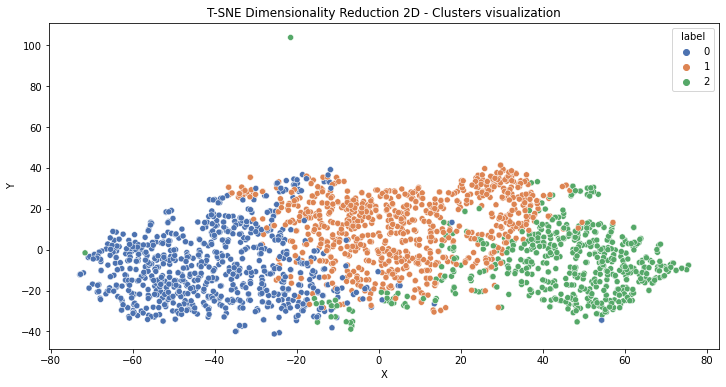

In [32]:
tsne_fig

# Classification Model

In [33]:
dummies_education = pd.get_dummies(data["Education"])
dummies_marital = pd.get_dummies(data["Marital_Status"])

data_classification = pd.concat([data, dummies_education, dummies_marital], axis=1)
data_classification.drop(["ID","Education", "Marital_Status", "Dt_Customer"], axis=1, inplace=True)

In [34]:
# split data into X and y
X = data_classification.drop(["Response"], axis=1)
Y = data_classification["Response"]
# split data into train and test sets
seed = 1
test_size = 0.3
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=test_size, random_state=seed)
# fit model no training data

prop = y_train.mean()

In [35]:
classes_weights = class_weight.compute_sample_weight(
    class_weight='balanced',
    y=y_train
)

In [36]:
np.unique(classes_weights)
# in fit : sample_weight=classes_weights

array([0.58420268, 3.46902655])

In [37]:
classifier = XGBClassifier(eval_metric="auc", scale_pos_weight=prop*1000).fit(X_train, y_train)

In [38]:
#columns_to_retain = set()
#boruta = BorutaPy(estimator=classifier, n_estimators="auto", max_iter=100)
#boruta.fit(np.array(X_train), np.array(y_train))
#green_area = X_train.columns[boruta.support_].to_list()
#columns_to_retain = columns_to_retain.union(green_area)

In [39]:
## split data into X and y
#X = data_classification[columns_to_retain]
#Y = data_classification["Response"]
## split data into train and test sets
#seed = 1
#test_size = 0.3
#X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=test_size, random_state=seed)

In [40]:
#classifier = XGBClassifier(eval_metric="auc").fit(X_train, y_train)

In [41]:
# make predictions for test data
y_pred = classifier.predict(X_test)
predictions = [round(value) for value in y_pred]
# evaluate predictions
accuracy = accuracy_score(y_test, predictions)
print("Accuracy: %.2f%%" % (accuracy * 100.0))

Accuracy: 86.16%


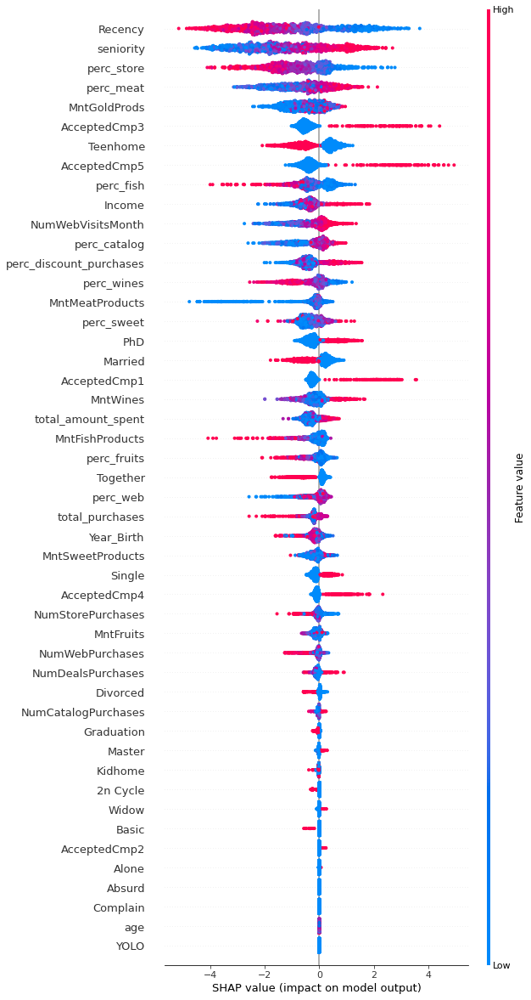

In [42]:
shap_values = shap.TreeExplainer(classifier).shap_values(X_train)
shap.summary_plot(shap_values, X_train, show=False, max_display=X_train.shape[1])

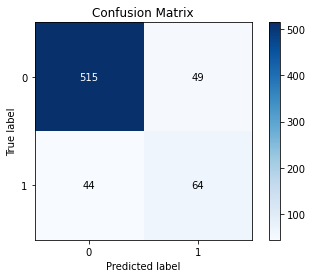

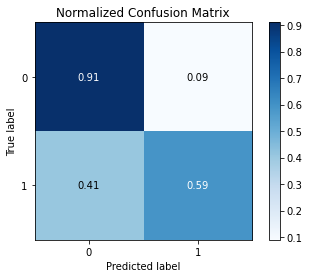

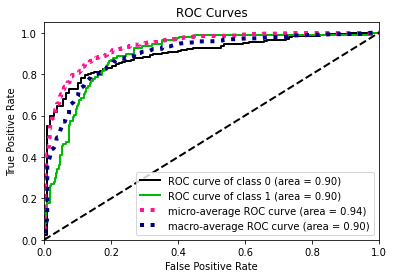

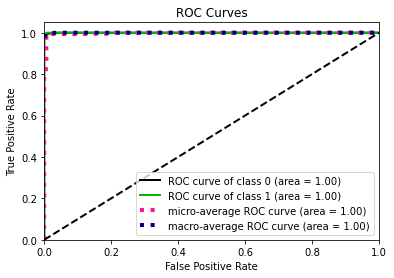

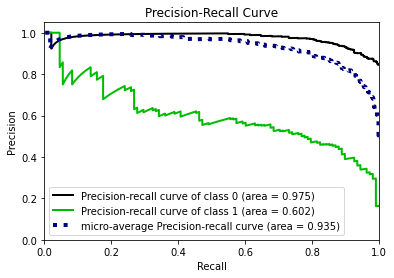

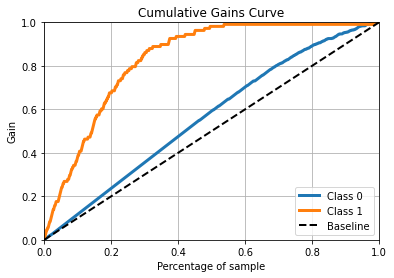

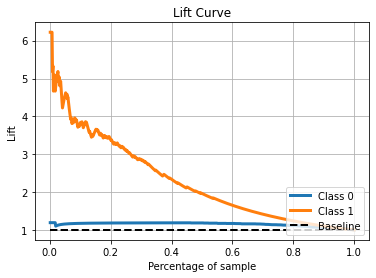

In [43]:
# Plot metrics 

plot_confusion_matrix(y_test, y_pred, normalize=False)
plt.show()

plot_confusion_matrix(y_test, y_pred, normalize=True)
plt.show()

plot_roc(y_test, classifier.predict_proba(X_test))
plt.show()

plot_roc(y_train, classifier.predict_proba(X_train))
plt.show()

plot_precision_recall(y_test, classifier.predict_proba(X_test))
plt.show()

plot_cumulative_gain(y_test, classifier.predict_proba(X_test))
plt.show()

plot_lift_curve(y_test, classifier.predict_proba(X_test))
plt.show()

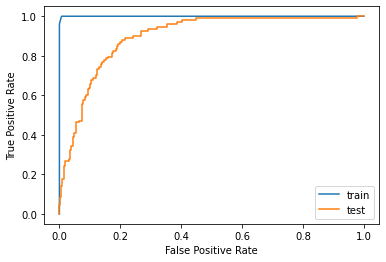

In [44]:
# Genera gráfica de roc
fig_roc, ax = plt.subplots()
fpr, tpr, _ = metrics.roc_curve(y_train.values, classifier.predict_proba(X_train)[:, 1])
metrics.RocCurveDisplay(fpr=fpr, tpr=tpr).plot(ax=ax, label="train")
fpr, tpr, _ = metrics.roc_curve(y_test.values, classifier.predict_proba(X_test)[:, 1])
metrics.RocCurveDisplay(fpr=fpr, tpr=tpr).plot(ax=ax, label="test")

In [45]:
# Print a classification report
print(classification_report(y_test, predictions, target_names=["non_respondents", "respondents"]))

                 precision    recall  f1-score   support

non_respondents       0.92      0.91      0.92       564
    respondents       0.57      0.59      0.58       108

       accuracy                           0.86       672
      macro avg       0.74      0.75      0.75       672
   weighted avg       0.86      0.86      0.86       672



In [57]:
from sklearn.model_selection import RandomizedSearchCV

In [47]:
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 100, stop = 200, num = 5)]
# Number of features to consider at every split
# max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 100, num = 10)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [2, 3, 4, 5]
# Method of selecting samples for training each tree
# bootstrap = [True, False]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               #'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf}


    "max_depth": np.random.randint(2, 20),
    "min_child_weight": 10 ** (np.random.rand() * 5 - 2),
    "gamma": 10 ** (np.random.rand() * 4 - 2),
    "subsample": np.random.rand() * 0.5 + 0.5,
    "colsample_bytree": np.random.rand(),
    "reg_alpha": 10 ** (np.random.rand() * 10 - 5),
    "reg_lambda": 10 ** (np.random.rand() * 10 - 5),
    "learning_rate": 10 ** (np.random.rand() * 2 - 2),
print(random_grid)

In [48]:
# Use the random grid to search for best hyperparameters
# First create the base model to tune
#f = RandomForestClassifier()
#f_random = RandomizedSearchCV(
#   estimator=rf,
#   param_distributions=random_grid,
#   n_iter=60,
#   cv=custom_index_cv,
#   verbose=2,
#   random_state=42,
#   n_jobs=2,
#
# Fit the random search model
#f_random.fit(X_train, y_train)

In [49]:
#rf_random.best_params_ # 5 Folds - 60 iterations
#rf_random.best_score_

In [50]:
#classifier_rf = RandomForestClassifier(
#    class_weight={0: prop, 1: 1 - prop},
#    max_features=5,
#    min_samples_leaf=2,
#    n_estimators=150,
#    random_state=42,
#)
#classifier_rf.fit(X_train, y_train)

In [70]:
10 ** (np.random.rand() * 4 - 2)

61.64019970322863

In [54]:
params = {
    "n_estimators": [int(x) for x in np.linspace(start = 100, stop = 200, num = 5)]
    "max_depth": [int(x) for x in np.linspace(start = 2, stop = 20, num = 10)],
    "min_child_weight": [int(x) for x in np.linspace(start = 1, stop = 200, num = 20)],
    "gamma": [int(x) for x in np.linspace(start = 0, stop = 100, num = 20)],
    "subsample": np.random.rand() * 0.5 + 0.5,
    "colsample_bytree": np.random.rand(),
    "reg_alpha": 10 ** (np.random.rand() * 10 - 5),
    "reg_lambda": 10 ** (np.random.rand() * 10 - 5),
    "learning_rate": 10 ** (np.random.rand() * 2 - 2),
    "scale_pos_weight" =144.1326530612245
    
}

In [64]:
10 ** (np.random.rand() * 5 -2 )

0.44129996255295356

In [65]:
classifier

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, eval_metric='auc',
              gamma=0, gpu_id=-1, importance_type='gain',
              interaction_constraints='', learning_rate=0.300000012,
              max_delta_step=0, max_depth=6, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=100, n_jobs=8,
              num_parallel_tree=1, random_state=0, reg_alpha=0, reg_lambda=1,
              scale_pos_weight=144.1326530612245, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [ ]:
[int(x) for x in np.linspace(start = 0, stop = 100, num = 20)]

In [ ]:
scale_pos_weight=144.1326530612245

In [78]:
10 ** (1 * 4 - 2)

100

In [79]:
10 ** (1 * 5 - 2)

1000